In [1]:
import numpy as np
import pandas as pd
import os
import sys
sys.path.append(os.path.abspath(os.path.join(r'C:\Users\Admin\Desktop\Havartechs\Projects\Telecommunication\Tellco_Analysis\scripts')))
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import helper
from plots import plots
from helper import TelecomHelper
# warnings
import warnings
warnings.filterwarnings('ignore')

In [10]:
# Give the path to the data 
CSV_PATH = r"C:\Users\Admin\Desktop\Havartechs\Projects\Telecommunication\Tellco_Analysis\Data\data.csv"

In [13]:
Helper = TelecomHelper()

In [14]:
# Import the data
df = Helper.read_csv(CSV_PATH, missing_values=["n/a", "na", "undefined"])

file read as csv


In [15]:
# Inspecting the head of the data
df.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,1.311448e+19,4/4/2019 12:01,770.0,4/25/2019 14:35,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16456699548519E+015,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311448e+19,4/9/2019 13:04,235.0,4/25/2019 8:15,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.311448e+19,4/9/2019 17:42,1.0,4/25/2019 11:58,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.311448e+19,4/10/2019 0:31,486.0,4/25/2019 7:36,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.311448e+19,4/12/2019 20:10,565.0,4/25/2019 10:40,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


In [16]:
def convert_labels(df):
        df.columns = [column.replace(' ', '_').lower() for column in df.columns]
        return df

In [17]:
df = convert_labels(df)


In [18]:
class OverViewAnalysis:
    
    def __init__(self, df):
        
        self.df = df
    
    
    def read_head(self, top=5):
        return self.df.head(top)
    
    # returning the number of rows columns and column information
    def get_info(self):
        row_count, col_count = self.df.shape
    
        print(f"Number of rows: {row_count}")
        print(f"Number of columns: {col_count}")
        print("================================")

        return (row_count, col_count), self.df.info()
    
    # gets number of distnict values in a given coumn
    def get_count(self, column_name):
        return self.df[column_name].value_counts()
    
    # getting the null count for every column
    def get_null_count(self, column_name):
        print("Null values count")
        print(self.df.isnull().sum())
        return self.df.isnull().sum()
    
    # getting the percentage of missing values
    def get_percent_missing(self):
        Helper = TelecomHelper()
        
        percent_missing = Helper.percent_missing(self.df)
        
        null_percent_df = pd.DataFrame(columns = ['column', 'null_percent'])
        columns = self.df.columns.values.tolist()
        
        null_percent_df['column'] = columns
        null_percent_df['null_percent'] = null_percent_df['column'].map(lambda x: Helper.percent_missing_for_col(self.df, x))
        
        
        return null_percent_df.sort_values(by=['null_percent'], ascending = False), percent_missing
    
    
    # returning the top handseet
    def top_handset_type(self, top=5):
        
        return self.df['handset_type'].value_counts().head(top)
    
    # returning the top handset manufactruer
    def top_manufacturer(self, top=5):
        
        return self.df['handset_manufacturer'].value_counts().head(top)
    
    # top handset by manfuctruer
    def top_handset_by_manufacturer(self, manufacturer, top=5):
        
        return df.groupby('handset_manufacturer')['handset_type'].value_counts()[manufacturer].head(top)
    
        

In [19]:
overViewAnal = OverViewAnalysis(df)

In [20]:
overViewAnal.read_head()


,bearer_id,start,start_ms,end,end_ms,dur._(ms),imsi,msisdn/number,imei,last_location_name,...,youtube_dl_(bytes),youtube_ul_(bytes),netflix_dl_(bytes),netflix_ul_(bytes),gaming_dl_(bytes),gaming_ul_(bytes),other_dl_(bytes),other_ul_(bytes),total_ul_(bytes),total_dl_(bytes)
0,1.311448e+19,4/4/2019 12:01,770.0,4/25/2019 14:35,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9.16456699548519E+015,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,1.311448e+19,4/9/2019 13:04,235.0,4/25/2019 8:15,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,1.311448e+19,4/9/2019 17:42,1.0,4/25/2019 11:58,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,1.311448e+19,4/10/2019 0:31,486.0,4/25/2019 7:36,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,1.311448e+19,4/12/2019 20:10,565.0,4/25/2019 10:40,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


In [21]:
overViewAnal.get_info()


Number of rows: 150001
Number of columns: 55
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150001 entries, 0 to 150000
Data columns (total 55 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   bearer_id                                 149010 non-null  float64
 1   start                                     150000 non-null  object 
 2   start_ms                                  150000 non-null  float64
 3   end                                       150000 non-null  object 
 4   end_ms                                    150000 non-null  float64
 5   dur._(ms)                                 150000 non-null  float64
 6   imsi                                      149431 non-null  float64
 7   msisdn/number                             148935 non-null  float64
 8   imei                                      149429 non-null  float64
 9   last_location_name                        14884

((150001, 55), None)

In [22]:
df.isnull().sum()

bearer_id                                      991
start                                            1
start_ms                                         1
end                                              1
end_ms                                           1
dur._(ms)                                        1
imsi                                           570
msisdn/number                                 1066
imei                                           572
last_location_name                            1153
avg_rtt_dl_(ms)                              27829
avg_rtt_ul_(ms)                              27812
avg_bearer_tp_dl_(kbps)                          1
avg_bearer_tp_ul_(kbps)                          1
tcp_dl_retrans._vol_(bytes)                  88146
tcp_ul_retrans._vol_(bytes)                  96649
dl_tp_<_50_kbps_(%)                            754
50_kbps_<_dl_tp_<_250_kbps_(%)                 754
250_kbps_<_dl_tp_<_1_mbps_(%)                  754
dl_tp_>_1_mbps_(%)             

In [23]:
null_percent_df, overall_missing = overViewAnal.get_percent_missing()
print(f"The overall missing perceentage is: {overall_missing}%")
print("=============================================")
null_percent_df

The overall missing perceentage is: 12.72%


,column,null_percent
34,nb_of_sec_with_37500b_<_vol_ul,86.84
36,nb_of_sec_with_6250b_<_vol_ul_<_37500b,74.56
31,nb_of_sec_with_125000b_<_vol_dl,65.02
15,tcp_ul_retrans._vol_(bytes),64.43
33,nb_of_sec_with_31250b_<_vol_dl_<_125000b,62.39
32,nb_of_sec_with_1250b_<_vol_ul_<_6250b,61.93
35,nb_of_sec_with_6250b_<_vol_dl_<_31250b,58.88
14,tcp_dl_retrans._vol_(bytes),58.76
25,http_ul_(bytes),54.54
24,http_dl_(bytes),54.32


In [24]:
from helper import TelecomHelper

class CleanTelecomData:
    def __init__(self, df: pd.DataFrame):
        self.df = df
        
        print('Automation in Action...!!!')

    def drop_duplicate(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        drop duplicate rows
        """
        df.drop_duplicates(inplace=True)

        return df

    def convert_to_datetime(self, df: pd.DataFrame) -> pd.DataFrame:
        """
        convert column to datetime
        """

        df['start'] = pd.to_datetime(
            df['start'])
        df['end'] = pd.to_datetime(
            df['end'])

        return df

    def drop_columns_with_null_values(self, df: pd.DataFrame, threshold_in_percent=30) -> pd.DataFrame:
        Helper = TelecomHelper()

        null_percent_df = pd.DataFrame(columns=['column', 'null_percent'])
        columns = df.columns.values.tolist()

        null_percent_df['column'] = columns
        null_percent_df['null_percent'] = null_percent_df['column'].map(
            lambda x: Helper.percent_missing_for_col(df, x))

        columns_to_be_dropped = null_percent_df[null_percent_df['null_percent']
                                                > threshold_in_percent]['column'].to_list()
        df = self.__drop_columns(df, columns_to_be_dropped)

        return df

    def drop_rows_with_null_values(self, df: pd.DataFrame, threshold_in_percent=1) -> pd.DataFrame:
        Helper = TelecomHelper()

        null_percent_df = pd.DataFrame(columns=['column', 'null_percent'])
        columns = df.columns.values.tolist()

        null_percent_df['column'] = columns
        null_percent_df['null_percent'] = null_percent_df['column'].map(
            lambda x: Helper.percent_missing_for_col(df, x))
        
        columns_subset = null_percent_df[null_percent_df['null_percent']
                                         < threshold_in_percent]['column'].to_list()

        df = df.dropna(subset=columns_subset)

        return df

    def handle_missing_qantitative_data_with_mean(self, df: pd.DataFrame, method="mean"):

        numeric_data = ['int16', 'int32', 'int64',
                        'float16', 'float32', 'float64']

        all_cols = df.columns.to_list()
        num_cols = [c for c in all_cols if df[c].dtypes in numeric_data]

        if (method == "mean"):

            for col in num_cols:
                df[col] = df[col].fillna(df[col].mean())

            return df

        elif method == "ffill":

            for col in num_cols:
                df[col] = df[col].fillna(method='ffill')

            return df

        elif method == "bfill":

            for col in num_cols:
                df[col] = df[col].fillna(method='bfill')

            return df
        else:
            print("Method unknown")
            return df
    
    def handle_missing_categorical_data_with_mean(self, df: pd.DataFrame, method="ffill"):

        numeric_data = ['int16', 'int32', 'int64',
                        'float16', 'float32', 'float64']

        all_cols = df.columns.to_list()
        num_cols = [c for c in all_cols if not df[c].dtypes in numeric_data]
        
        if method == "ffill":

            for col in num_cols:
                df[col] = df[col].fillna(method='ffill')

            return df

        elif method == "bfill":

            for col in num_cols:
                df[col] = df[col].fillna(method='bfill')

            return df
        else:
            print("Method unknown")
            return df

    def convert_to_mega_bytes(self, df):

        df = self.__convert_bytes_to_megabytes(df, 'social_media_dl_(bytes)')
        df = self.__convert_bytes_to_megabytes(df, 'social_media_ul_(bytes)')

        df = self.__convert_bytes_to_megabytes(df, "google_dl_(bytes)")
        df = self.__convert_bytes_to_megabytes(df, "google_ul_(bytes)")

        df = self.__convert_bytes_to_megabytes(df, "email_dl_(bytes)")
        df = self.__convert_bytes_to_megabytes(df, "email_ul_(bytes)")

        df = self.__convert_bytes_to_megabytes(df, "youtube_dl_(bytes)")
        df = self.__convert_bytes_to_megabytes(df, "youtube_ul_(bytes)")

        df = self.__convert_bytes_to_megabytes(df, "netflix_dl_(bytes)")
        df = self.__convert_bytes_to_megabytes(df, "netflix_ul_(bytes)")

        df = self.__convert_bytes_to_megabytes(df, "gaming_dl_(bytes)")
        df = self.__convert_bytes_to_megabytes(df, "gaming_ul_(bytes)")

        df = self.__convert_bytes_to_megabytes(df, "other_dl_(bytes)")
        df = self.__convert_bytes_to_megabytes(df, "other_ul_(bytes)")

        df = self.__convert_bytes_to_megabytes(df, "total_dl_(bytes)")
        df = self.__convert_bytes_to_megabytes(df, "total_ul_(bytes)")

        converted_df = df.rename(columns={'social_media_dl_(bytes)': 'social_media_dl',
                                          'social_media_ul_(bytes)': 'social_media_ul',

                                          'google_dl_(bytes)': 'google_dl',
                                          'google_ul_(bytes)': 'google_ul',

                                          'email_dl_(bytes)': 'email_dl',
                                          'email_ul_(bytes)': 'email_ul',

                                          'youtube_dl_(bytes)': 'youtube_dl',
                                          'youtube_ul_(bytes)': 'youtube_ul',

                                          'netflix_dl_(bytes)': 'netflix_dl',
                                          'netflix_ul_(bytes)': 'netflix_ul',

                                          'gaming_dl_(bytes)': 'gaming_dl',
                                          'gaming_ul_(bytes)': 'gaming_ul',

                                          'other_dl_(bytes)': 'other_dl',
                                          'other_ul_(bytes)': 'other_ul',

                                          'total_dl_(bytes)': 'total_dl',
                                          'total_ul_(bytes)': 'total_ul',
                                          })
        return converted_df

    def __drop_columns(self, df, columns=[]):

        return df.drop(columns, axis=1)

    def __convert_bytes_to_megabytes(df, bytes_data):

        megabyte = 1*10e+5
        megabyte_col = df[bytes_data] / megabyte

        return megabyte_col

In [25]:
cleanTelecomData = CleanTelecomData(df)

Automation in Action...!!!


In [26]:
cleaned_df = cleanTelecomData.drop_columns_with_null_values(df, 30)

cleaned_df = cleanTelecomData.convert_to_datetime(cleaned_df)

cleaned_df = cleanTelecomData.drop_duplicate(cleaned_df)

cleaned_df = cleanTelecomData.drop_rows_with_null_values(cleaned_df, 1)

cleaned_df = cleanTelecomData.handle_missing_qantitative_data_with_mean(cleaned_df)

cleaned_df = cleanTelecomData.handle_missing_categorical_data_with_mean(cleaned_df, "ffill")



overViewAnal_2 = OverViewAnalysis(cleaned_df)

In [27]:
null_percent_df, overall_missing = overViewAnal_2.get_percent_missing()
print(f"The overall missing perceentage is: {overall_missing}%")
print("=============================================")

The overall missing perceentage is: 0.0%


In [28]:
print(f"percent of null value rows in last_location_name column: {Helper.percent_missing_for_col(cleaned_df, 'last_location_name')}%"
     )
print(f"percent of null value rows in handset_manufacturer: {Helper.percent_missing_for_col(cleaned_df, 'handset_manufacturer')}%")
print(f"percent of null value rows in handset_type: {Helper.percent_missing_for_col(cleaned_df, 'handset_type')}%")
print(f"percent of null value rows in start: {Helper.percent_missing_for_col(cleaned_df, 'start')}%")
print(f"percent of null value rows in end: {Helper.percent_missing_for_col(cleaned_df, 'end')}%")

percent of null value rows in last_location_name column: 0.0%
percent of null value rows in handset_manufacturer: 0.0%
percent of null value rows in handset_type: 0.0%
percent of null value rows in start: 0.0%
percent of null value rows in end: 0.0%


- The data at this point has no missing value. It is fully clean

In [29]:
overViewAnal.top_handset_type(top=10)

handset_type
Huawei B528S-23A                19752
Apple iPhone 6S (A1688)          9419
Apple iPhone 6 (A1586)           9023
Apple iPhone 7 (A1778)           6326
Apple iPhone Se (A1723)          5187
Apple iPhone 8 (A1905)           4993
Apple iPhone Xr (A2105)          4568
Samsung Galaxy S8 (Sm-G950F)     4520
Apple iPhone X (A1901)           3813
Samsung Galaxy A5 Sm-A520F       3724
Name: count, dtype: int64

In [30]:
overViewAnal.top_manufacturer(top=3)


handset_manufacturer
Apple      59565
Samsung    40839
Huawei     34423
Name: count, dtype: int64

In [31]:
overViewAnal.top_handset_by_manufacturer('Apple', 5)

handset_type
Apple iPhone 6S (A1688)    9419
Apple iPhone 6 (A1586)     9023
Apple iPhone 7 (A1778)     6326
Apple iPhone Se (A1723)    5187
Apple iPhone 8 (A1905)     4993
Name: count, dtype: int64

In [32]:
overViewAnal.top_handset_by_manufacturer('Samsung', 5)

handset_type
Samsung Galaxy S8 (Sm-G950F)    4520
Samsung Galaxy A5 Sm-A520F      3724
Samsung Galaxy J5 (Sm-J530)     3696
Samsung Galaxy J3 (Sm-J330)     3484
Samsung Galaxy S7 (Sm-G930X)    3199
Name: count, dtype: int64

In [33]:
overViewAnal.top_handset_by_manufacturer('Huawei', 5)


handset_type
Huawei B528S-23A                  19752
Huawei E5180                       2079
Huawei P20 Lite Huawei Nova 3E     2021
Huawei P20                         1480
Huawei Y6 2018                      997
Name: count, dtype: int64

In [34]:
cleaned_df['bearer_id'].isnull().any()
print(f"percent missing for bearer_id is:{Helper.percent_missing_for_col(cleaned_df, 'bearer_id')}")

percent missing for bearer_id is:0.0


In [35]:
print(f"percent missing for msisdn/number is:{Helper.percent_missing_for_col(cleaned_df, 'msisdn/number')}")

percent missing for msisdn/number is:0.0


In [36]:
cleaned_df = cleaned_df.dropna(subset=['msisdn/number'])
print(f"percent missing for msisdn/number is:{Helper.percent_missing_for_col(cleaned_df, 'msisdn/number')}")

percent missing for msisdn/number is:0.0


In [37]:
# Number of xdr sessions
sessions = cleaned_df.groupby('msisdn/number').agg({'bearer_id': 'count'})
sessions = sessions.rename(columns= {'bearer_id': 'xDR_sessions'})
sessions.sort_values(by=['xDR_sessions'], ascending = False).head(10)

,xDR_sessions
msisdn/number,
3.362632e+10,18
3.361489e+10,17
3.362578e+10,17
3.365973e+10,16
3.367588e+10,15
3.376054e+10,15
3.366716e+10,13
3.360313e+10,12
3.376041e+10,12


In [38]:
sessions.describe()


,xDR_sessions
count,105719.000000
mean,1.389447
std,0.796173
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,18.000000


In [39]:
print(f"percent missing for dur._(ms) is:{Helper.percent_missing_for_col(cleaned_df, 'dur._(ms)')}")


percent missing for dur._(ms) is:0.0


In [40]:
# we group the data using  msisdn (customer number) and find sum the the duration for each customer

durations = cleaned_df.groupby('msisdn/number').agg({'dur._(ms)': 'sum'})


durations=durations.rename(columns= {'dur._(ms)': 'total_duration(ms)'})
durations.sort_values(by=['total_duration(ms)'], ascending = False).head(10)

,total_duration(ms)
msisdn/number,
3.362578e+10,18553754.0
3.361489e+10,9966898.0
3.376054e+10,9279434.0
3.362632e+10,8791927.0
3.366716e+10,8744914.0
3.366469e+10,6288730.0
3.360313e+10,6287761.0
3.366746e+10,5649882.0
3.376041e+10,5321667.0


In [41]:
durations.describe()


,total_duration(ms)
count,1.057190e+05
mean,1.462114e+05
std,1.845391e+05
min,7.142000e+03
25%,7.272900e+04
50%,1.031110e+05
75%,1.727990e+05
max,1.855375e+07


In [42]:
total_data_df = cleaned_df[['msisdn/number','total_ul_(bytes)','total_dl_(bytes)']].copy()
total_data_df = total_data_df.groupby('msisdn/number').sum()
total_data_df['total_data(bytes)'] = total_data_df['total_ul_(bytes)'] + total_data_df['total_dl_(bytes)']
total_data_df.sort_values(by=['total_data(bytes)'], ascending = False).head(10)

,total_ul_(bytes),total_dl_(bytes),total_data(bytes)
msisdn/number,,,
3.361489e+10,689483001.0,8.156743e+09,8.846226e+09
3.376054e+10,703478581.0,7.811295e+09,8.514774e+09
3.362578e+10,729577380.0,7.770043e+09,8.499621e+09
3.362632e+10,669650721.0,7.301517e+09,7.971167e+09
3.367588e+10,581568792.0,7.309542e+09,7.891111e+09
3.365973e+10,624260321.0,7.081602e+09,7.705863e+09
3.366646e+10,405060976.0,6.903440e+09,7.308501e+09
3.376041e+10,521518890.0,6.610852e+09,7.132371e+09
3.366471e+10,471244453.0,6.400774e+09,6.872018e+09


In [43]:
total_data_df.describe()


,total_ul_(bytes),total_dl_(bytes),total_data(bytes)
count,1.057190e+05,1.057190e+05,1.057190e+05
mean,5.713601e+07,6.317300e+08,6.888661e+08
std,3.527180e+07,4.609209e+08,4.869964e+08
min,2.866892e+06,8.827082e+06,3.324901e+07
25%,3.637849e+07,3.142406e+08,3.579501e+08
50%,4.676298e+07,5.693797e+08,6.169335e+08
75%,6.550410e+07,8.062981e+08,8.564738e+08
max,7.295774e+08,8.156743e+09,8.846226e+09


In [44]:
cleaned_df["social_media"] = cleaned_df["social_media_dl_(bytes)"] + cleaned_df['social_media_ul_(bytes)']
cleaned_df["google"] = cleaned_df["google_dl_(bytes)"] + cleaned_df["google_ul_(bytes)"]
cleaned_df['email'] = cleaned_df["email_dl_(bytes)"] + cleaned_df["email_ul_(bytes)"]
cleaned_df['youtube'] = cleaned_df["youtube_dl_(bytes)"] + cleaned_df["youtube_ul_(bytes)"]
cleaned_df['netflix'] = cleaned_df["netflix_dl_(bytes)"] + cleaned_df["netflix_ul_(bytes)"]
cleaned_df["gaming"] = cleaned_df["gaming_dl_(bytes)"] + cleaned_df["gaming_ul_(bytes)"]
cleaned_df['other']= cleaned_df["other_dl_(bytes)"]+ cleaned_df["other_ul_(bytes)"]
cleaned_df['total_data'] = cleaned_df['total_dl_(bytes)'] + cleaned_df['total_ul_(bytes)']

In [45]:
app_total_data = cleaned_df[['msisdn/number','social_media','google',
                             'email', 'youtube','netflix', 'gaming','other']].copy()

In [46]:
app_total_data.groupby('msisdn/number').sum().sample(10)


,social_media,google,email,youtube,netflix,gaming,other
msisdn/number,,,,,,,
3.361055e+10,5147258.0,16341642.0,5364124.0,49048096.0,46460927.0,4.362865e+08,4.926560e+08
3.368186e+10,2122478.0,12511968.0,2675396.0,11570893.0,34906048.0,8.185978e+08,5.476946e+08
3.365876e+10,1864443.0,2408876.0,1343339.0,27534734.0,17670088.0,2.868161e+08,9.973631e+07
3.365991e+10,1381744.0,12683969.0,669665.0,26038568.0,21688217.0,4.750823e+08,7.492182e+08
3.361445e+10,2812892.0,10522681.0,4830979.0,30689768.0,41736617.0,1.081137e+09,1.316374e+09
3.365863e+10,2137024.0,9415961.0,1575843.0,27476950.0,36044850.0,2.658758e+08,3.664351e+08
3.364639e+10,3122755.0,7948540.0,2754256.0,29800770.0,15852418.0,3.547346e+08,5.227617e+08
3.365803e+10,2912110.0,11881252.0,1877460.0,23241391.0,22164752.0,2.500130e+08,7.921620e+08
3.376333e+10,127385.0,10386703.0,2087554.0,36081914.0,30577723.0,5.041249e+08,4.720511e+08


In [47]:
app_total_data.describe()


,msisdn/number,social_media,google,email,youtube,netflix,gaming,other
count,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05,1.468910e+05
mean,3.596855e+10,1.827740e+06,7.807978e+06,2.259078e+06,2.264199e+07,2.262936e+07,4.303551e+08,4.292667e+08
std,8.792026e+11,1.035571e+06,3.517121e+06,1.071128e+06,9.244557e+06,9.259223e+06,2.440902e+08,2.432095e+08
min,3.360100e+10,1.563000e+03,4.033000e+04,8.359000e+03,1.296550e+05,9.843200e+04,3.063580e+05,1.490450e+05
25%,3.365128e+10,9.313390e+05,4.943585e+06,1.359012e+06,1.599734e+07,1.598200e+07,2.186982e+08,2.184706e+08
50%,3.366369e+10,1.825390e+06,7.815399e+06,2.263843e+06,2.266341e+07,2.263459e+07,4.316651e+08,4.297978e+08
75%,3.368344e+10,2.727156e+06,1.068314e+07,3.159587e+06,2.929342e+07,2.928815e+07,6.415728e+08,6.396656e+08
max,3.370000e+14,3.650861e+06,1.552878e+07,4.518036e+06,4.519008e+07,4.519815e+07,8.592028e+08,8.595209e+08


In [48]:
SAVE_PATH = "../data/cleaned_data.csv"


In [49]:
cleaned_df =Helper.save_csv(cleaned_df, SAVE_PATH)


Save failed...


In [50]:
Helper.percent_missing(cleaned_df)


0.0

In [51]:
cleaned_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 146891 entries, 0 to 149999
Data columns (total 53 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   bearer_id                       146891 non-null  float64       
 1   start                           146891 non-null  datetime64[ns]
 2   start_ms                        146891 non-null  float64       
 3   end                             146891 non-null  datetime64[ns]
 4   end_ms                          146891 non-null  float64       
 5   dur._(ms)                       146891 non-null  float64       
 6   imsi                            146891 non-null  float64       
 7   msisdn/number                   146891 non-null  float64       
 8   imei                            146891 non-null  float64       
 9   last_location_name              146891 non-null  object        
 10  avg_rtt_dl_(ms)                 146891 non-null  float64     

# Task 1.2
I choosed 13 columns for further EDA. 4 of them are categorical while the rest are quantitative.

'msisdn/number', 'last_location_name', 'handset_manufacturer', 'handset_type' are the categorical ones

In [52]:
explore_feature_df = cleaned_df[['msisdn/number', 'last_location_name',
                                 'handset_manufacturer', 'handset_type', 'dur._(ms)', 
                                 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming','other', 'total_data'
                                ]]

In [53]:
explore_feature_df = explore_feature_df.rename(columns={'other':'other_data','msisdn/number': 'msisdn', 'last_location_name': 'location','dur._(ms)': 'duration_ms' })


In [54]:
explore_feature_df.head()


,msisdn,location,handset_manufacturer,handset_type,duration_ms,social_media,google,email,youtube,netflix,gaming,other_data,total_data
0,3.366496e+10,9.16456699548519E+015,Samsung,Samsung Galaxy A5 Sm-A520F,1823652.0,1570185.0,2905912.0,3701304.0,18355943.0,17855187.0,292426453.0,180558843.0,345629377.0
1,3.368185e+10,L77566A,Samsung,Samsung Galaxy J5 (Sm-J530),1365104.0,1933278.0,4414096.0,937385.0,39359124.0,35565545.0,609920783.0,541959383.0,707185356.0
2,3.376063e+10,D42335A,Samsung,Samsung Galaxy A8 (2018),1361762.0,1726277.0,10229119.0,3363124.0,34425237.0,23751202.0,229980251.0,414908351.0,307690973.0
3,3.375034e+10,T21824A,Samsung,Samsung Galaxy A8 (2018),1321509.0,657493.0,11811761.0,2070983.0,36534765.0,15092588.0,810387875.0,761837216.0,889352748.0
4,3.369980e+10,D88865A,Samsung,Samsung Sm-G390F,1089009.0,912788.0,7748843.0,2110349.0,34222253.0,17539799.0,531237049.0,564619822.0,607681403.0


In [55]:
def convert_bytes_to_megabytes(df, bytes_data):

        megabyte = 1*10e+5
        megabyte_col = df[bytes_data] / megabyte

        return megabyte_col

In [56]:
explore_feature_df['social_media'] = convert_bytes_to_megabytes(explore_feature_df, 'social_media')

explore_feature_df['google'] = convert_bytes_to_megabytes(explore_feature_df, 'google')

explore_feature_df['email'] = convert_bytes_to_megabytes(explore_feature_df, 'email')

explore_feature_df['youtube'] = convert_bytes_to_megabytes(explore_feature_df, 'youtube')

explore_feature_df['netflix'] = convert_bytes_to_megabytes(explore_feature_df, 'netflix')

explore_feature_df['gaming'] = convert_bytes_to_megabytes(explore_feature_df, 'gaming')

explore_feature_df['total_data'] = convert_bytes_to_megabytes(explore_feature_df, 'total_data')

explore_feature_df['other_data'] = convert_bytes_to_megabytes(explore_feature_df, 'other_data')

In [57]:

def plot_hist(df:pd.DataFrame, column:str, color:str)->None:
    plt.figure(figsize=(9, 7))
    sns.displot(data=df, x=column, color=color, kde=True, height=7, aspect=2)
    plt.title(f'Distribution of {column}', size=20, fontweight='bold')
    plt.show()

def plot_dist(df:pd.DataFrame, column:str):
    plt.figure(figsize=(9,7))
    sns.distplot(df).set_title(f'Distribution of {column}')
    plt.show()


def plot_count(df:pd.DataFrame, column:str) -> None:
    plt.figure(figsize=(12, 7))
    sns.countplot(data=df, x=column)
    plt.title(f'Plot count of {column}', size=20, fontweight='bold')
    plt.show()
    
def plot_bar(df:pd.DataFrame, x_col:str, y_col:str, title:str, xlabel:str, ylabel:str)->None:
    plt.figure(figsize=(12, 7))
    sns.barplot(data = df, x=x_col, y=y_col)
    plt.title(title, size=20)
    plt.xticks(rotation=75, fontsize=14)
    plt.yticks( fontsize=14)
    plt.xlabel(xlabel, fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.show()

def plot_heatmap(df:pd.DataFrame, title:str, cbar=False)->None:
    plt.figure(figsize=(12, 7))
    sns.heatmap(df, annot=True, cmap='viridis', vmin=0, vmax=1, fmt='.2f', linewidths=.7, cbar=cbar )
    plt.title(title, size=18, fontweight='bold')
    plt.show()

def plot_box(df:pd.DataFrame, x_col:str, title:str) -> None:
    plt.figure(figsize=(12, 7))
    sns.boxplot(data = df, x=x_col)
    plt.title(title, size=20)
    plt.xticks(rotation=75, fontsize=14)
    plt.show()

def plot_box_multi(df:pd.DataFrame, x_col:str, y_col:str, title:str) -> None:
    plt.figure(figsize=(12, 7))
    sns.boxplot(data = df, x=x_col, y=y_col)
    plt.title(title, size=20)
    plt.xticks(rotation=75, fontsize=14)
    plt.yticks( fontsize=14)
    plt.show()

def plot_scatter(df: pd.DataFrame, x_col: str, y_col: str, title: str, hue: str, style: str) -> None:
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data = df, x=x_col, y=y_col, hue=hue, style=style)
    plt.title(title, size=20)
    plt.xticks(fontsize=14)
    plt.yticks( fontsize=14)
    plt.show()
    

## Univariate non-graphical Analysis

In [58]:
quntitative_df = explore_feature_df[['duration_ms', 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming', 'total_data', 'other_data' ]]

In [59]:
quntitative_df.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
duration_ms,146891.0,105229.880394,80924.455397,7142.000000,58527.000000,86399.000000,133154.500000,1.859336e+06
social_media,146891.0,1.827740,1.035571,0.001563,0.931339,1.825390,2.727156,3.650861e+00
google,146891.0,7.807978,3.517121,0.040330,4.943585,7.815399,10.683145,1.552878e+01
email,146891.0,2.259078,1.071128,0.008359,1.359012,2.263843,3.159587,4.518036e+00
youtube,146891.0,22.641990,9.244557,0.129655,15.997340,22.663408,29.293419,4.519008e+01
netflix,146891.0,22.629360,9.259223,0.098432,15.981996,22.634588,29.288154,4.519815e+01
gaming,146891.0,430.355126,244.090217,0.306358,218.698198,431.665078,641.572846,8.592028e+02
total_data,146891.0,495.784159,244.441632,28.956107,284.485028,496.924346,706.637913,9.559848e+02
other_data,146891.0,429.266672,243.209547,0.149045,218.470640,429.797759,639.665594,8.595209e+02


### Univariate Graphical Analysis
#### Outlier detections

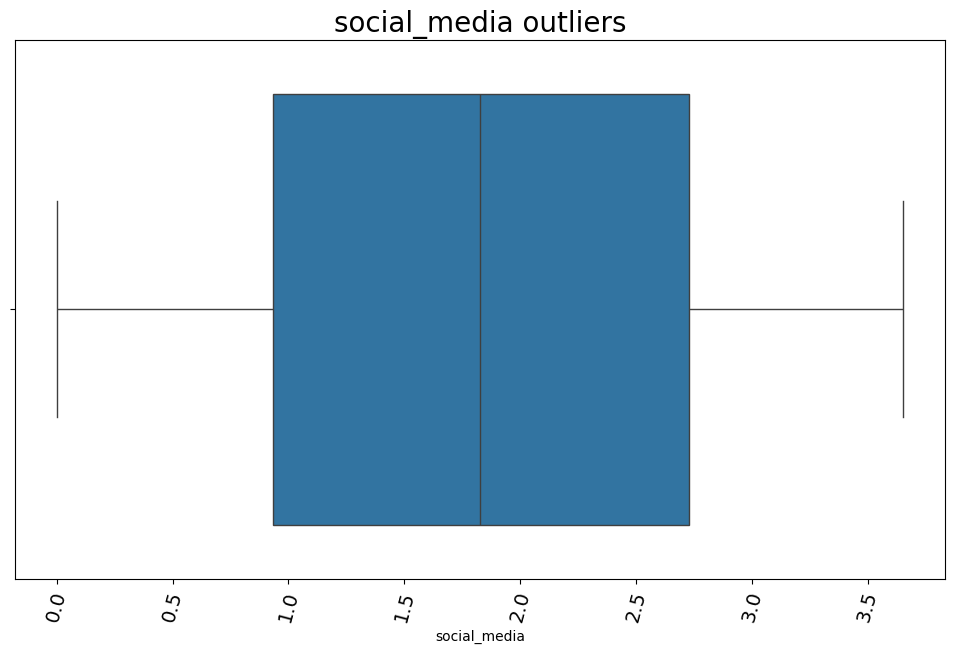

In [60]:
plot_box(quntitative_df, "social_media", "social_media outliers")


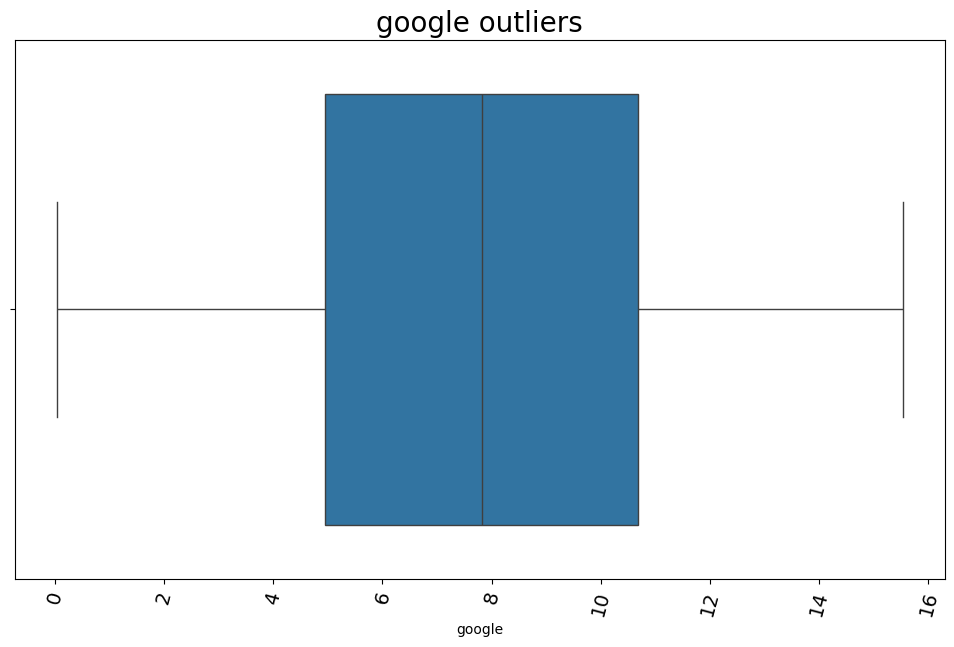

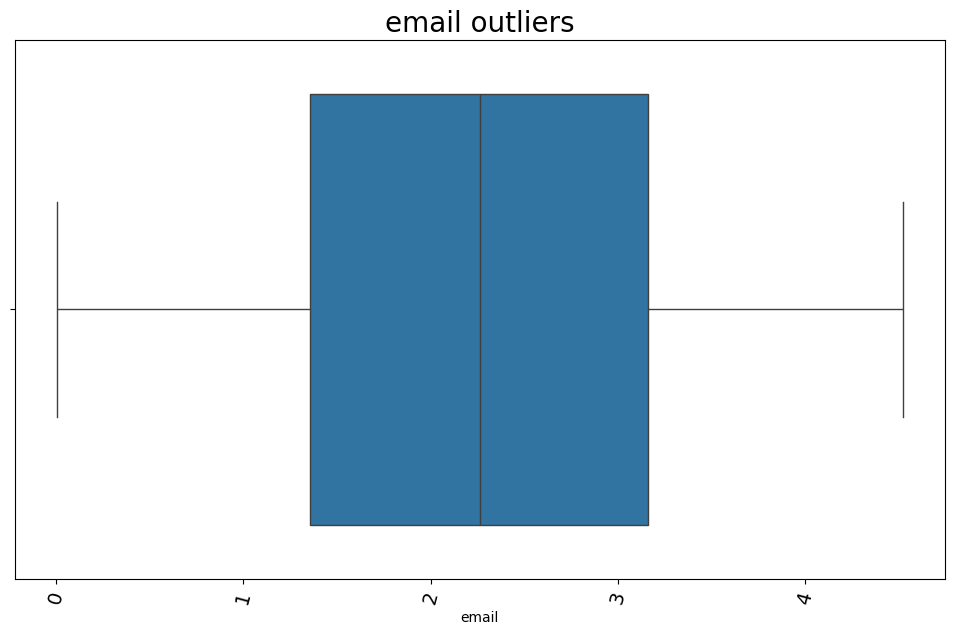

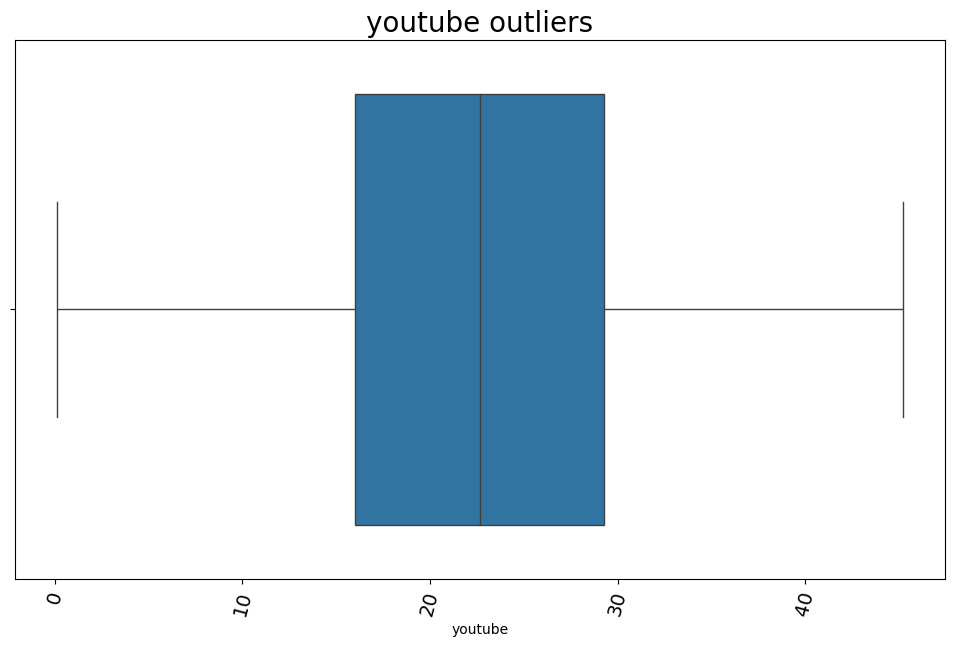

In [61]:
plot_box(quntitative_df, "google", "google outliers")

plot_box(quntitative_df, "email", "email outliers")

plot_box(quntitative_df, "youtube", "youtube outliers")

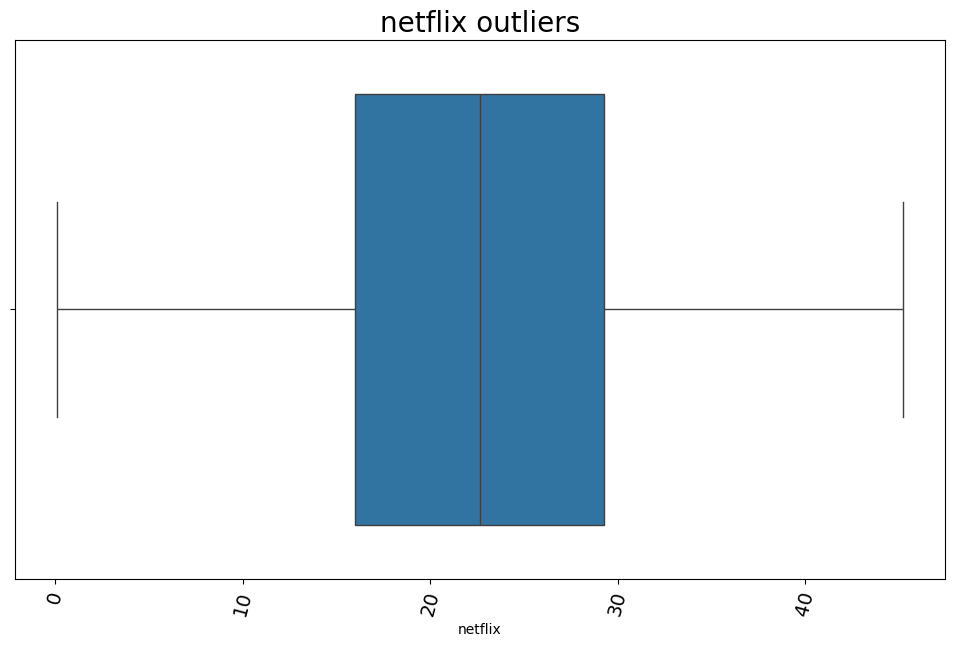

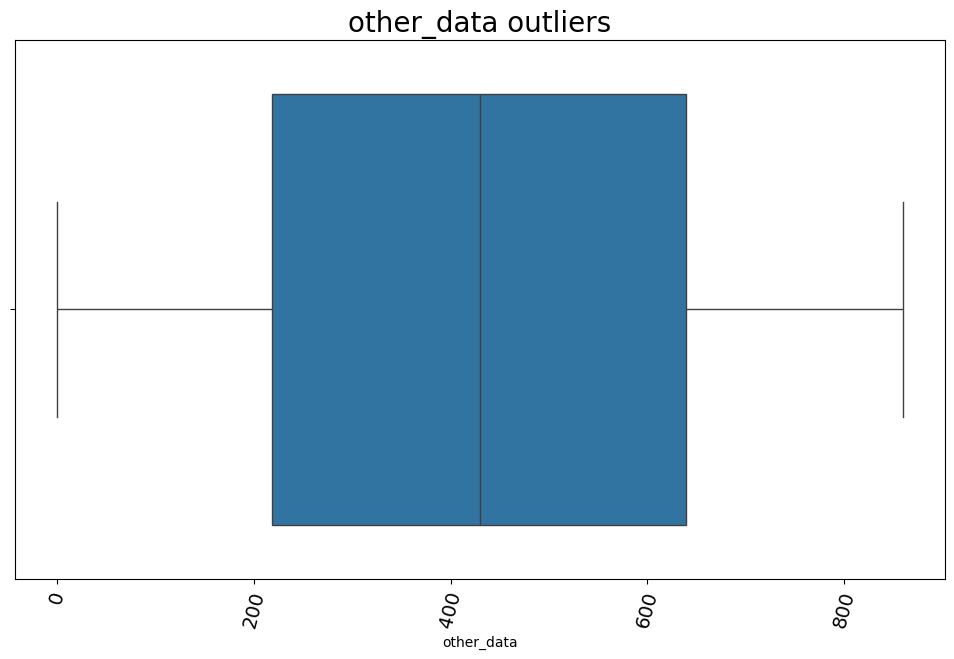

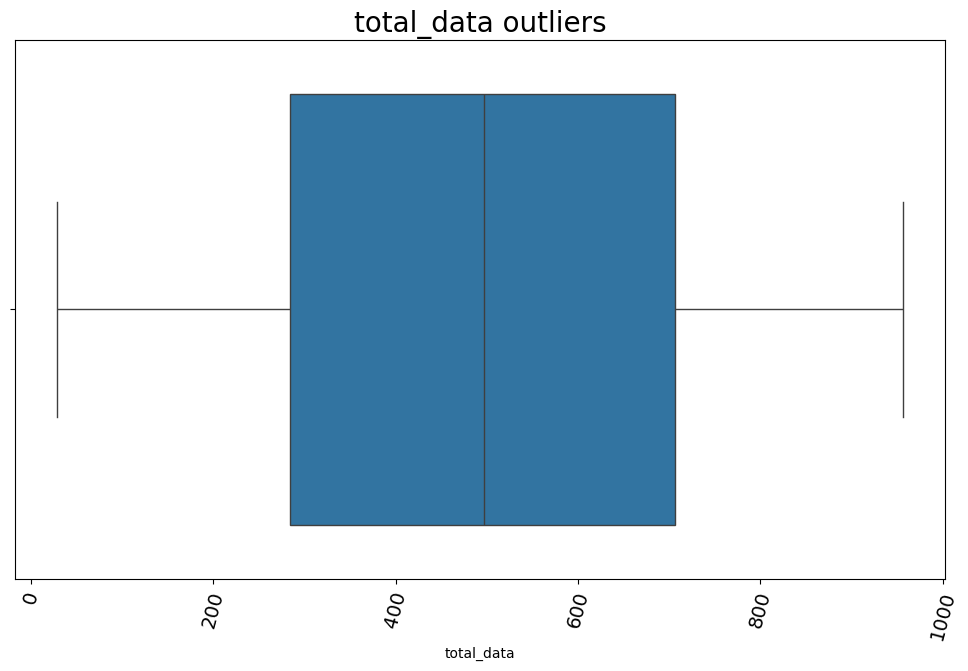

In [62]:
plot_box(quntitative_df, "netflix", "netflix outliers")

plot_box(quntitative_df, "other_data", "other_data outliers")

plot_box(quntitative_df, "total_data", "total_data outliers")

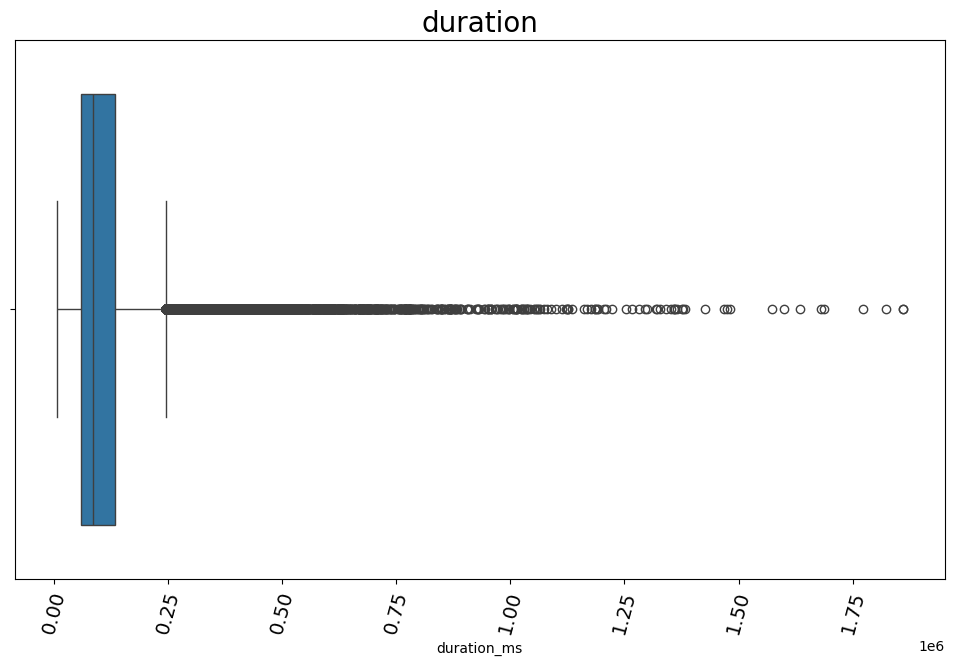

In [63]:
## Outlier detection for duration
plot_box(quntitative_df, "duration_ms", "duration")


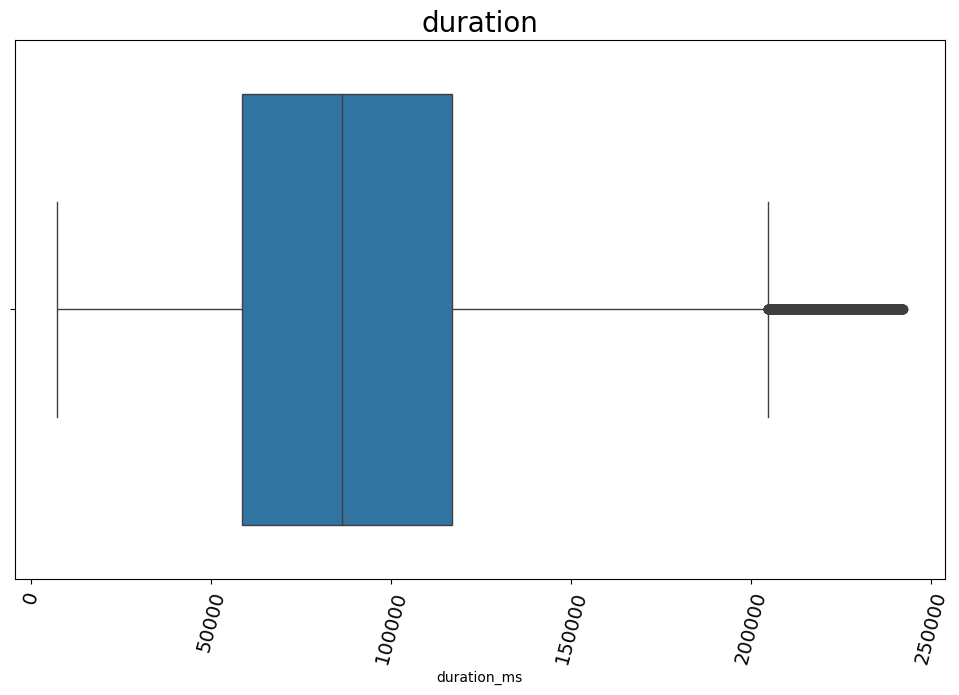

In [64]:
quntitative_df['duration_ms'] = np.where(quntitative_df['duration_ms'] > quntitative_df['duration_ms'].quantile(0.95),
                                         quntitative_df['duration_ms'].mode(),quntitative_df['duration_ms'])
plot_box(quntitative_df, "duration_ms", "duration")

<Figure size 900x700 with 0 Axes>

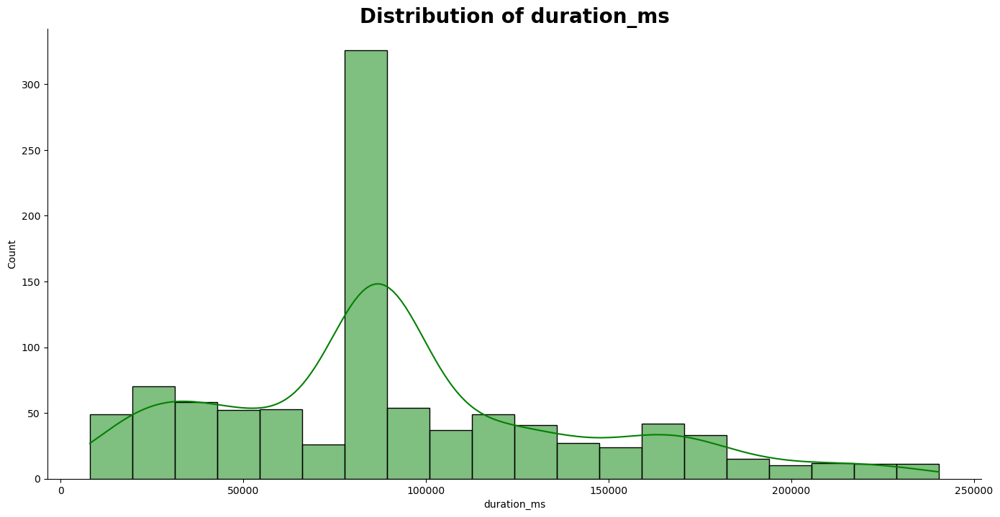

In [65]:
plot_hist(quntitative_df.sample(1000), 'duration_ms', color='green')

<Figure size 900x700 with 0 Axes>

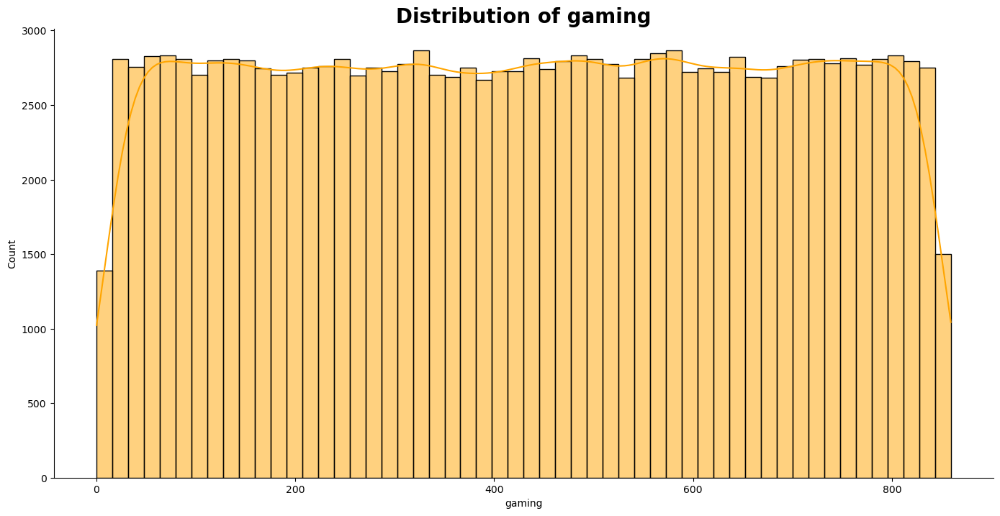

<Figure size 900x700 with 0 Axes>

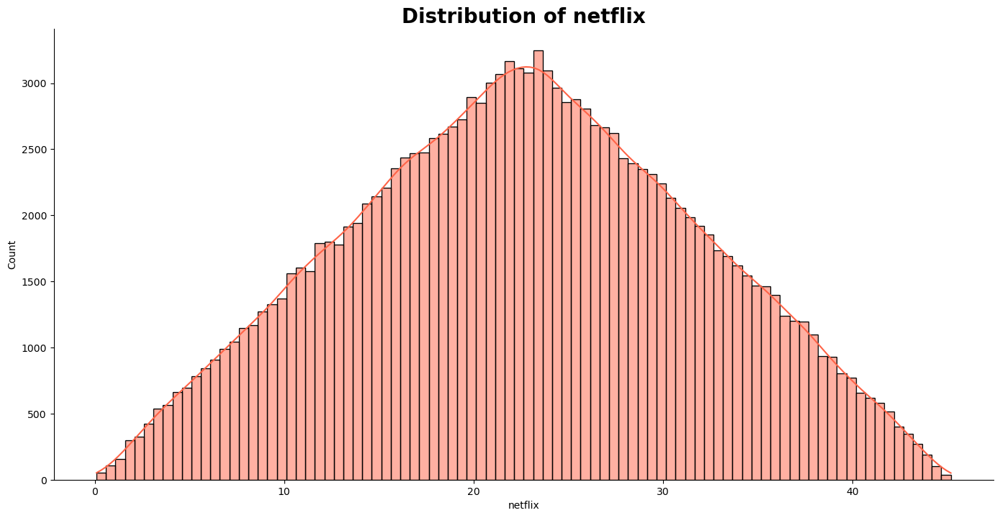

<Figure size 900x700 with 0 Axes>

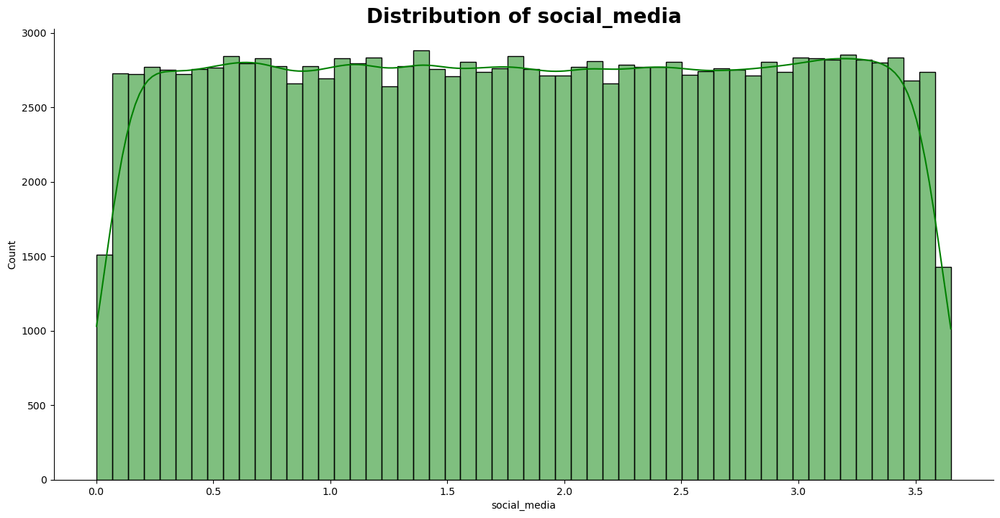

In [66]:
plot_hist(quntitative_df, 'gaming', color='orange')

plot_hist(quntitative_df, 'netflix', color='tomato')

plot_hist(quntitative_df, 'social_media', color='green')

<Figure size 900x700 with 0 Axes>

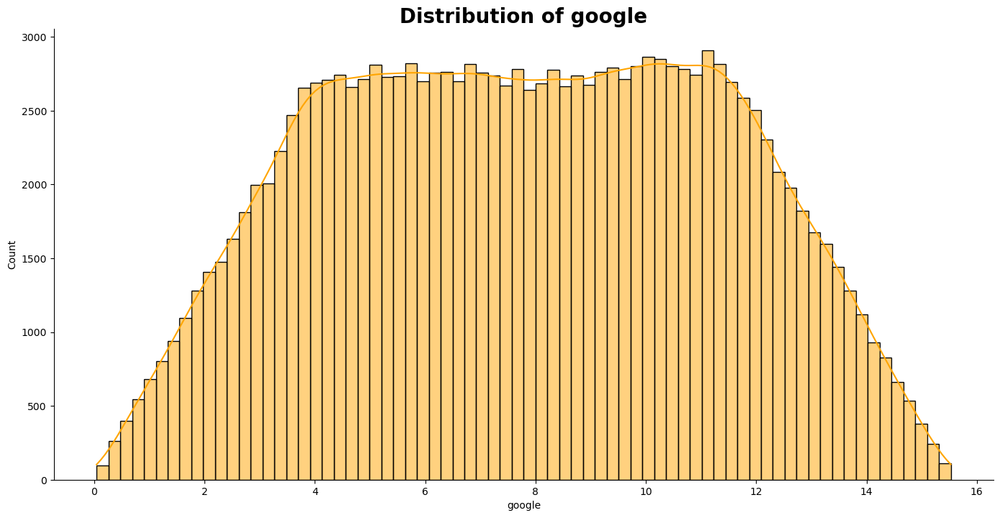

<Figure size 900x700 with 0 Axes>

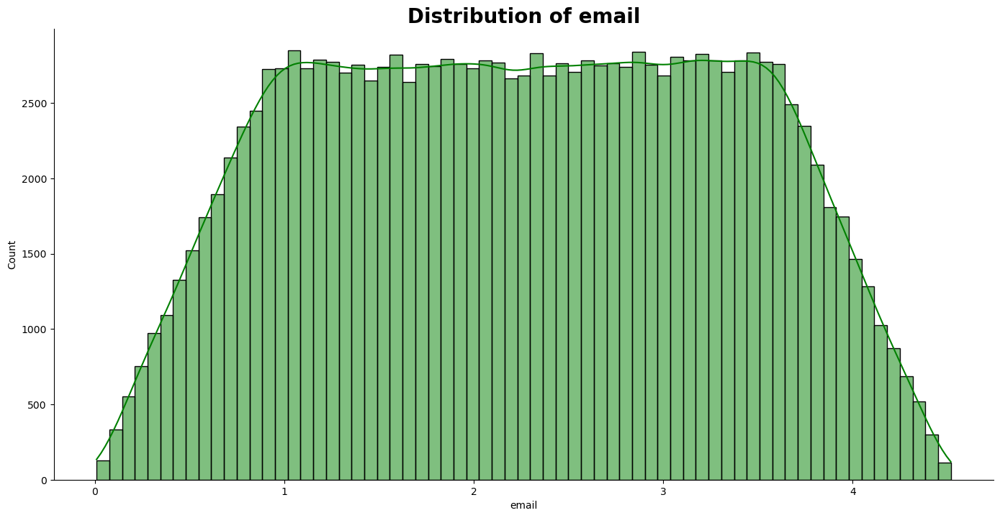

<Figure size 900x700 with 0 Axes>

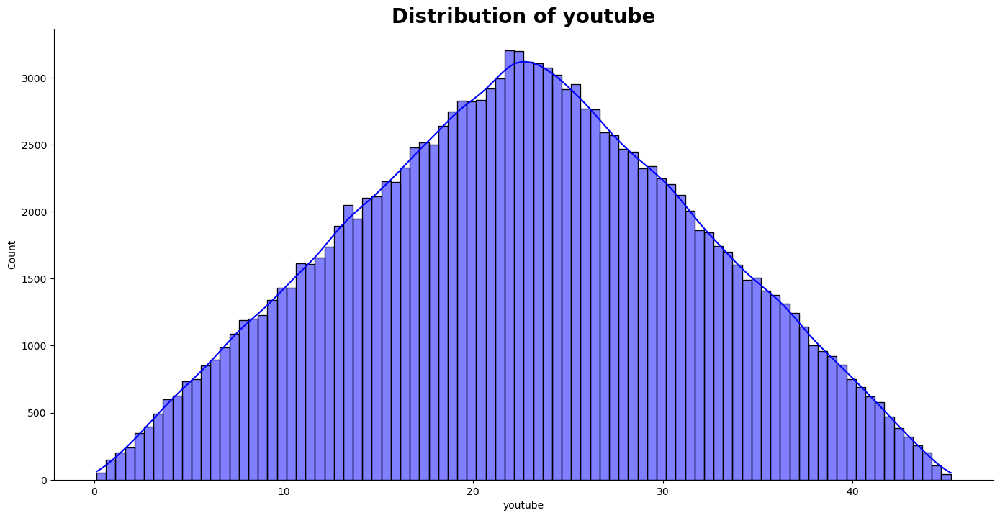

In [67]:
plot_hist(quntitative_df, 'google', color='orange')

plot_hist(quntitative_df, 'email', color='green')

plot_hist(quntitative_df, 'youtube', color='blue')

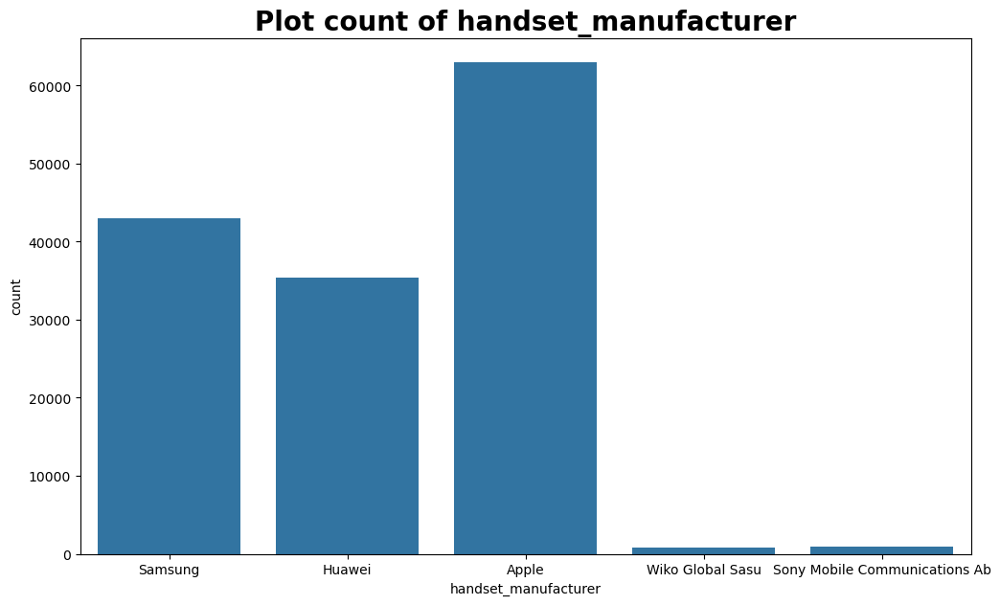

In [68]:
top_manfacturers = overViewAnal.top_manufacturer(top=5).index[:5].to_list()
filter_row = explore_feature_df['handset_manufacturer'].isin(top_manfacturers)

count_df = explore_feature_df[filter_row]
plot_count(count_df, 'handset_manufacturer')


In [69]:
total_data = explore_feature_df[['msisdn', 'social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data', 'total_data', 'handset_manufacturer']]
total_data_agg = total_data.groupby('msisdn').sum()
total_data_agg

,social_media,google,email,youtube,netflix,gaming,other_data,total_data,handset_manufacturer
msisdn,,,,,,,,,
3.360100e+10,2.232135,4.389005,1.331362,21.624548,27.180981,812.458661,386.570872,878.690574,Huawei
3.360100e+10,2.660565,5.334863,3.307781,12.432223,11.221763,119.750078,281.710071,156.859643,Apple
3.360100e+10,3.195623,3.443126,3.205380,21.333570,19.353900,538.827713,501.693672,595.966483,Apple
3.360101e+10,0.280294,9.678493,2.284670,6.977321,1.942092,391.126127,35.279702,422.320698,Apple
3.360101e+10,2.912542,18.499616,3.305469,41.533002,49.201724,1314.797820,804.804484,1457.410944,AppleApple
...,...,...,...,...,...,...,...,...,...
3.378997e+10,1.413370,9.892882,3.396607,28.226479,30.370302,134.815919,408.107210,208.123067,Apple
3.378998e+10,4.250312,10.246473,5.315327,38.012812,51.950311,972.344996,1075.140407,1094.693386,AppleHuawei
3.379000e+10,0.300183,7.531269,1.006915,26.647843,14.902538,660.361359,295.282817,714.641641,Huawei


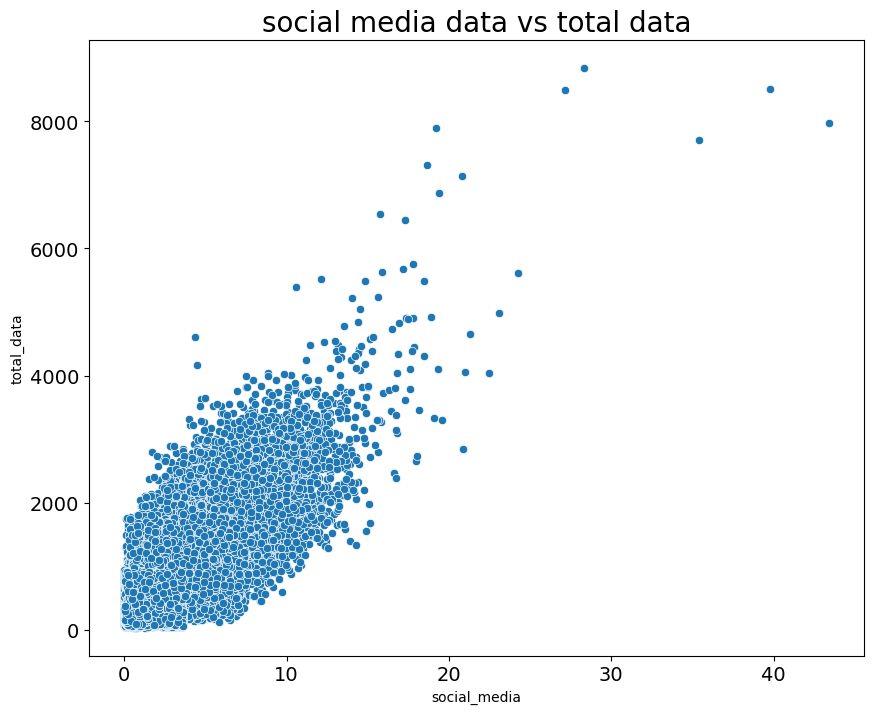

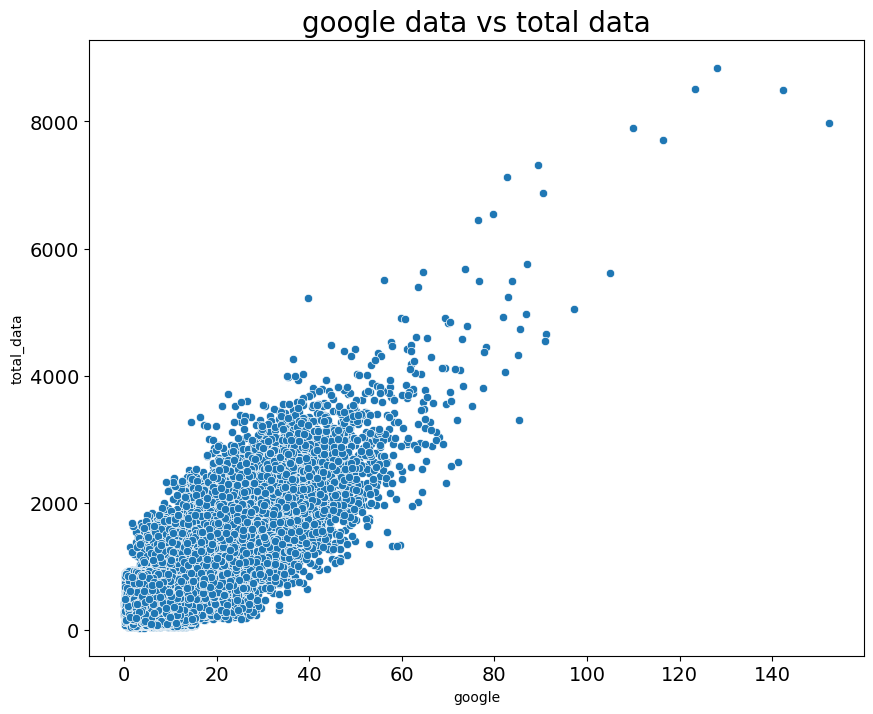

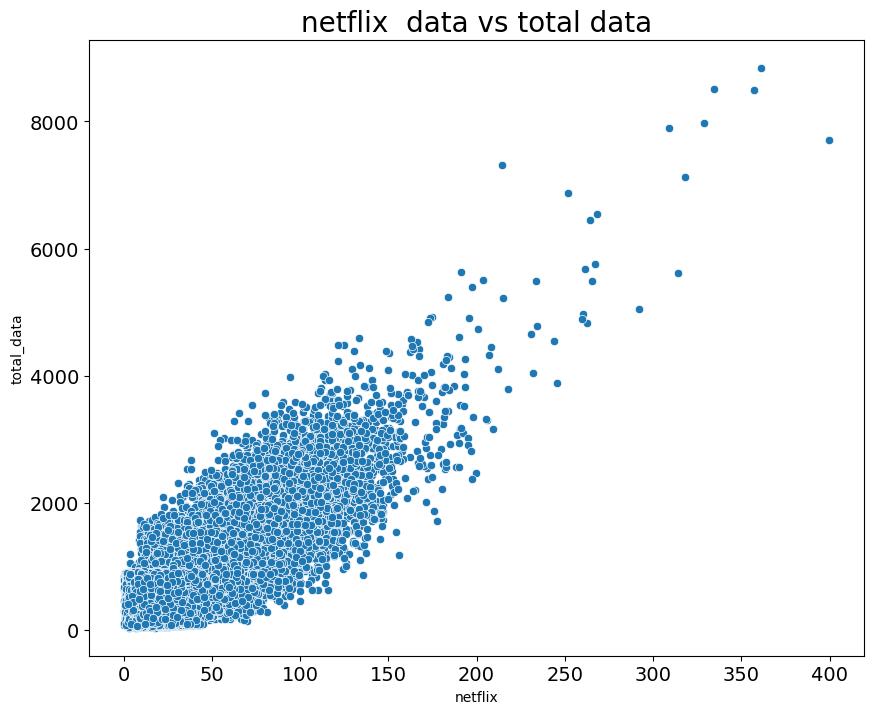

In [70]:
plot_scatter(total_data_agg, 'social_media', 'total_data', 'social media data vs total data',  None,  None)

plot_scatter(total_data_agg, 'google', 'total_data', 'google data vs total data',  None,  None)

plot_scatter(total_data_agg, 'netflix', 'total_data', 'netflix  data vs total data',  None,  None)

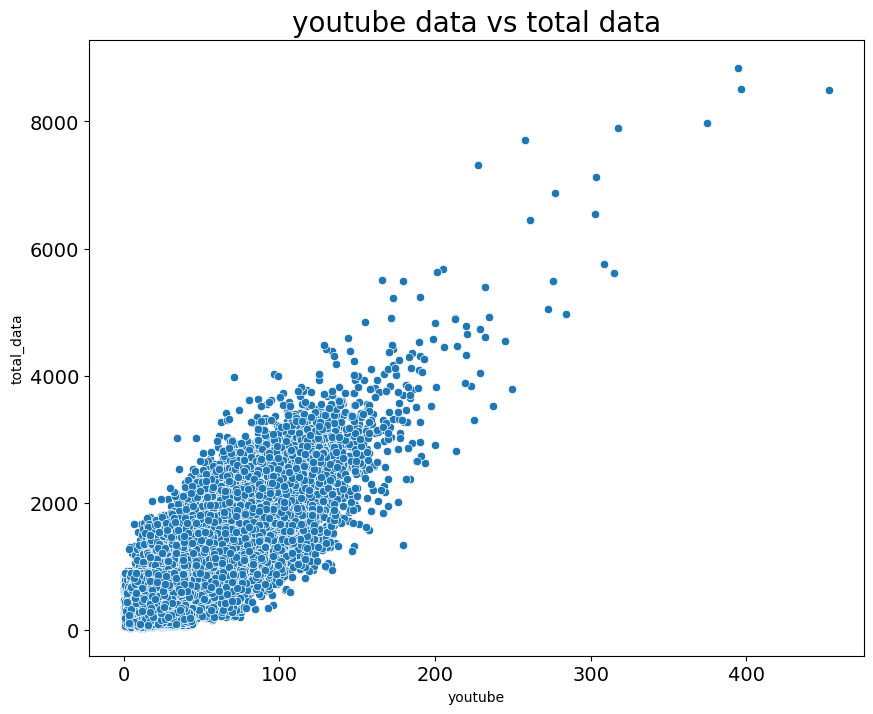

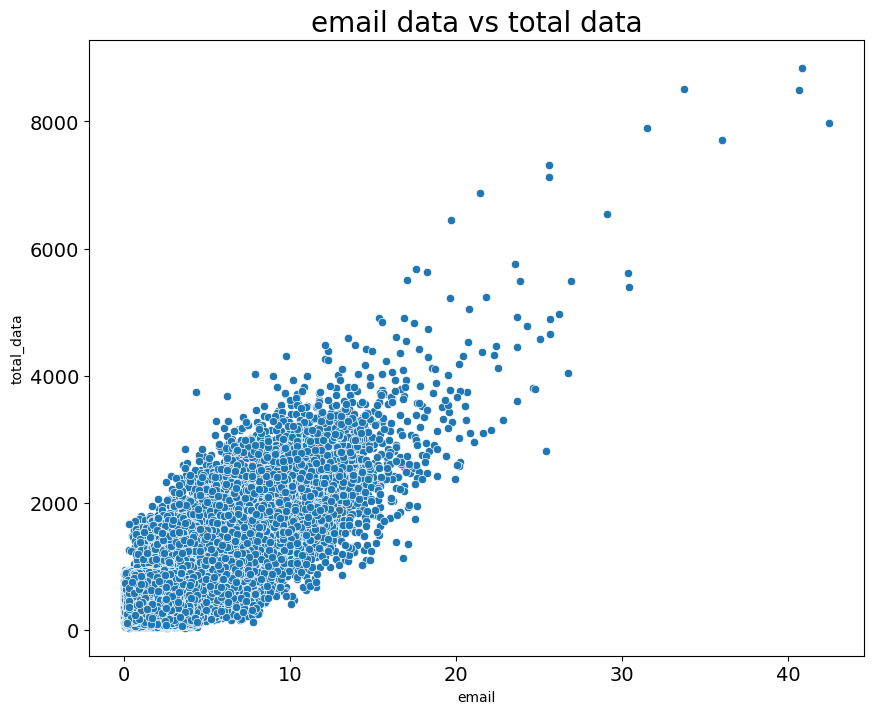

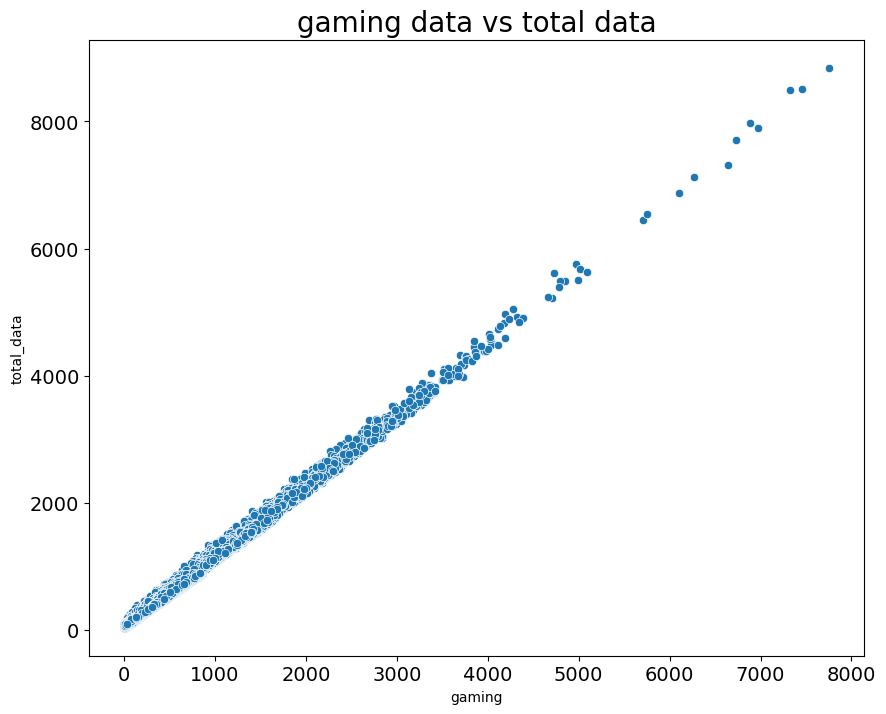

In [71]:
plot_scatter(total_data_agg, 'youtube', 'total_data', 'youtube data vs total data',  None,  None)
plot_scatter(total_data_agg, 'email', 'total_data', 'email data vs total data',  None,  None)
plot_scatter(total_data_agg, 'gaming', 'total_data', 'gaming data vs total data',  None,  None)

In [72]:
total_data = explore_feature_df[['social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data', 'total_data']]

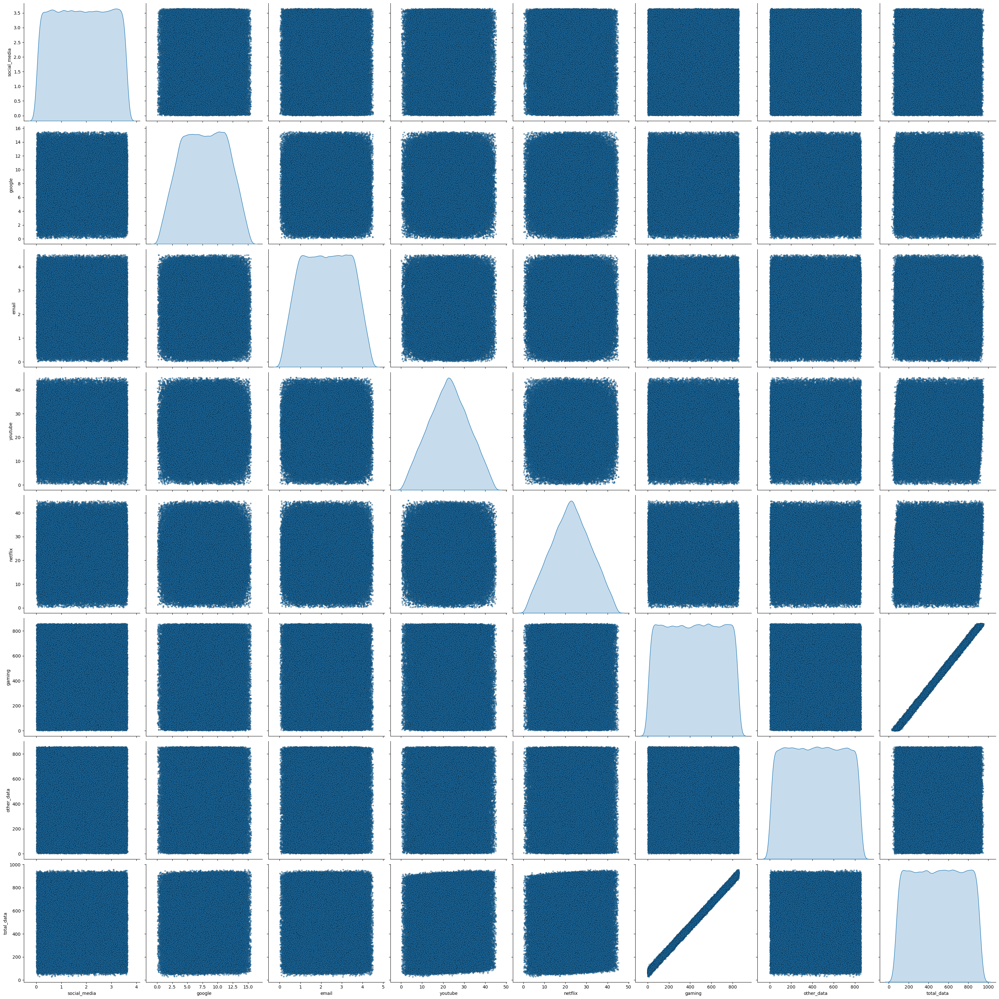

In [73]:
sns.color_palette("crest", as_cmap=True)
sns.pairplot(total_data, diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 10, 'edgecolor': 'k'},
             height=4)

In [74]:
social_media_total = total_data.sum()[0]
google_total = total_data.sum()[1]
email_total = total_data.sum()[2]
youtube_total = total_data.sum()[3]
netflix_total = total_data.sum()[4]
gaming_total = total_data.sum()[5]
other_data = total_data.sum()[6]


app_total_count_df = pd.DataFrame(columns=['app', 'total'])
app_total_count_df['app'] = ['social_media', 'google', 'email', 'youtube', 'netflix', 'gaming', 'other_data']

app_total_count_df['total'] = [social_media_total, google_total, email_total, youtube_total, netflix_total, gaming_total,  other_data]
app_total_count_df

,app,total
0,social_media,2.684786e+05
1,google,1.146922e+06
2,email,3.318382e+05
3,youtube,3.325905e+06
4,netflix,3.324049e+06
5,gaming,6.321529e+07
6,other_data,6.305541e+07


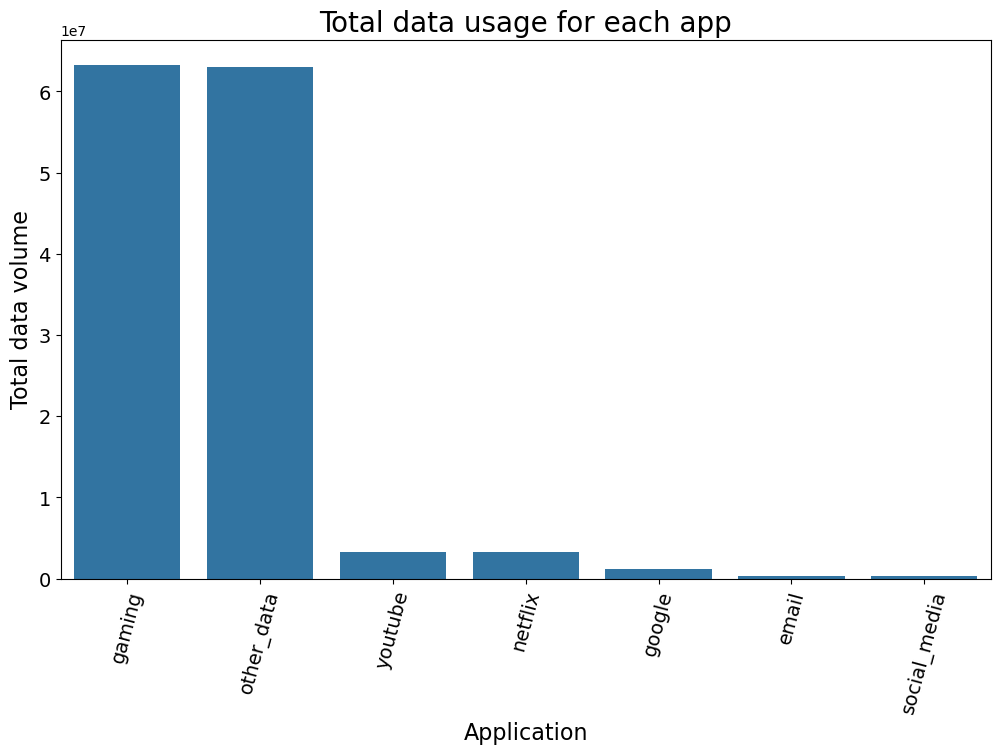

In [75]:
plot_bar(app_total_count_df.sort_values(by=['total'], ascending = False), x_col='app', y_col='total', title="Total data usage for each app", xlabel="Application", ylabel="Total data volume")


In [76]:
px.pie(app_total_count_df, values="total",
                     names="app", width=700, height=500)

In [77]:
from sklearn.preprocessing import MinMaxScaler

# I scaled the duration by dividing it to 1000 to easily
# compare it with total data which has already been converted to megabytes

scaled_explore_feature_df = explore_feature_df[['msisdn', 'total_data', 'duration_ms']]

scaled_explore_feature_df['duration_ms'] = explore_feature_df['duration_ms']/1000
scaled_explore_feature_df = scaled_explore_feature_df.rename(columns={'duration_ms': 'duration'})

scaled_explore_feature_df_agg = scaled_explore_feature_df.groupby('msisdn').agg({'duration':'sum', 'total_data': 'sum'})

deciles = pd.qcut(scaled_explore_feature_df_agg['duration'], 5, labels=["1st_decile", "2nd_decile",
                                                      "3rd_decile", "4th_decile",
                                                      "5th_decile"])



explore_feature_df_with_decile = scaled_explore_feature_df_agg.copy()

explore_feature_df_with_decile['decile'] = deciles

explore_feature_df_with_decile_agg = explore_feature_df_with_decile.groupby('decile').agg({'total_data': 'sum',
                                                                                           'duration': 'sum'})
explore_feature_df_with_decile_agg

,total_data,duration
decile,,
1st_decile,1.143024e+07,647473.886
2nd_decile,1.227127e+07,1778391.158
3rd_decile,1.156663e+07,2130274.650
4th_decile,1.377434e+07,3414760.017
5th_decile,2.378375e+07,7486422.650


<Figure size 1000x700 with 0 Axes>

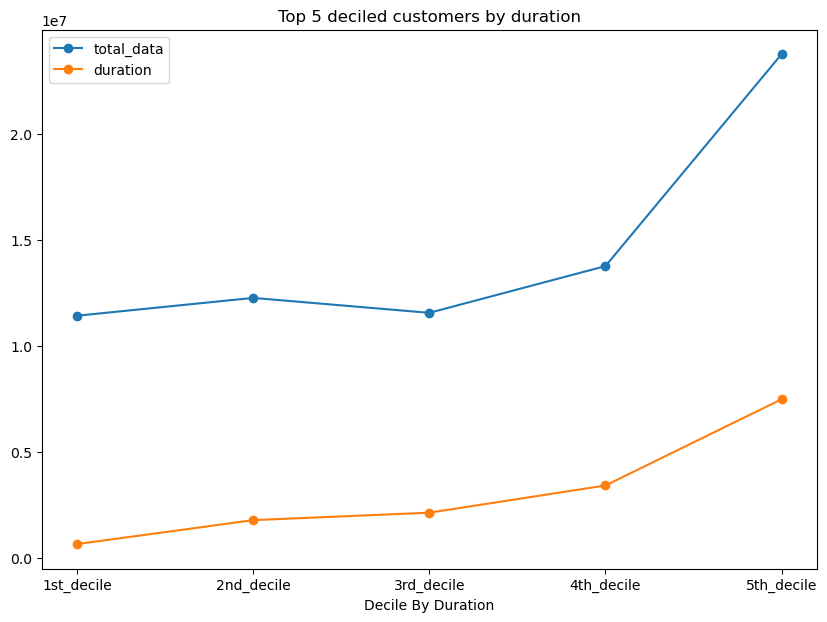

In [78]:
plt.figure(figsize=(10,7))
explore_feature_df_with_decile_agg.plot(linestyle='-', marker='o', figsize=(10,7), title='Top 5 deciled customers by duration').set_xlabel("Decile By Duration")
plt.xticks(np.arange(len(explore_feature_df_with_decile_agg.index)), explore_feature_df_with_decile_agg.index)

plt.show()

In [79]:
total_data_2 = explore_feature_df[['social_media', 'google', 'email', 'youtube', 'netflix',
                                 'gaming',  'other_data']]

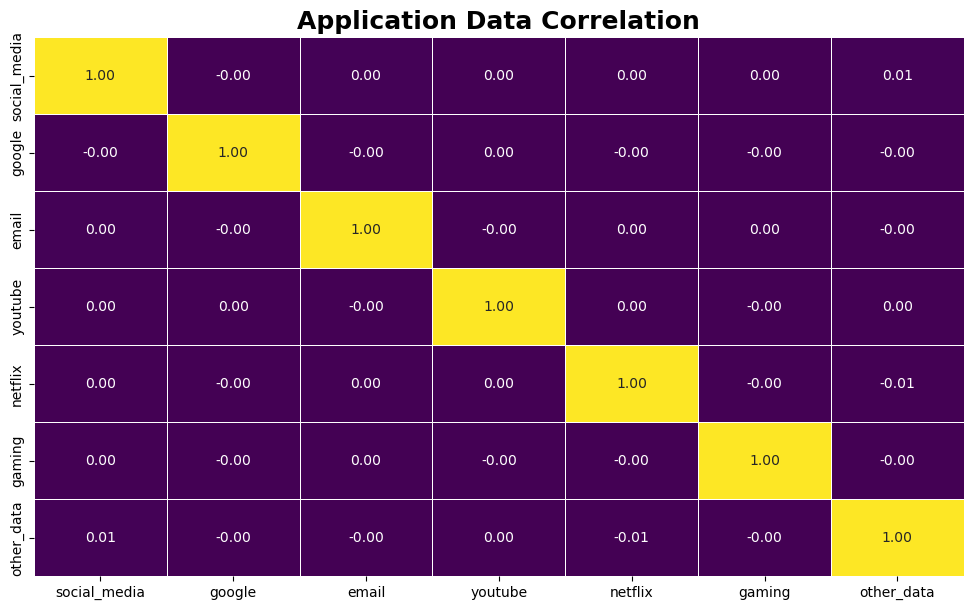

,social_media,google,email,youtube,netflix,gaming,other_data
social_media,1.000000,-0.001919,0.004188,0.000580,0.001386,0.001901,0.005540
google,-0.001919,1.000000,-0.000049,0.002178,-0.002013,-0.000803,-0.001290
email,0.004188,-0.000049,1.000000,-0.003438,0.001499,0.000065,-0.000778
youtube,0.000580,0.002178,-0.003438,1.000000,0.003611,-0.003670,0.003235
netflix,0.001386,-0.002013,0.001499,0.003611,1.000000,-0.003532,-0.007927
gaming,0.001901,-0.000803,0.000065,-0.003670,-0.003532,1.000000,-0.002821
other_data,0.005540,-0.001290,-0.000778,0.003235,-0.007927,-0.002821,1.000000


In [80]:
data_correlation = total_data_2.corr()
plot_heatmap(data_correlation, 'Application Data Correlation')
data_correlation